# Single Image Super Resolution with SRCNN

This is an implementation of SRCNN using Tensorflow.  
SRCNN is a single image super resolution algorithm proposed in https://arxiv.org/pdf/1501.00092.pdf.  

There are several differences between my implementation and the original paper:  
1. I use 64x64 sub-images with stride 48, instead of 33x33 sub-images with stride 14.  
2. I use paddings so that the size of upscaled images remain the same, while the paper did not use padding to prevent edge effects, resulting in smaller upscaled images.  
3. My model takes input with 3 channels (RGB) instead of 1 luminance channel in YCbCr.  
4. The learning rate of all layers are the same, whereas the last layer learns 10 times slower in the paper.  
5. I use DIV2K dataset for training instead of ImageNet or 91-images.  

In [1]:
import numpy as np
import tensorflow as tf
from tensorflow.keras import layers, models
from custom_image_dataset_from_directory import image_dataset_from_directory
import matplotlib.pyplot as plt
import os
from PIL import Image
import utils

In [2]:
upscale_factor = 4
batch_size = 32

# Size for the training images
lr_image_size = (64,64) 
hr_image_size = (lr_image_size[0] * upscale_factor, lr_image_size[1] * upscale_factor)

# Stride for the cropping images
lr_stride = (lr_image_size[0] * 3 // 4, lr_image_size[1] * 3 // 4) 
hr_stride = (lr_stride[0] * upscale_factor, lr_stride[1] * upscale_factor)

model_dir = 'models'

# 1. Data Preprocessing

DIV2K is used for training.  
Set5, Set14, B100, Urban100, Manga109 can be used for testing.

Training images are cropped into square sub images of train_image_size using the custom image_dataset_from_directory() function.  
Note that ```image_dataset_from_directory()``` is modified from the Tensorflow source code (https://github.com/keras-team/keras/blob/v2.7.0/keras/preprocessing/image_dataset.py#L30-L227) for generating the dataset with cropping rather than the default ```smart_resize()```. Set crop_to_aspect_ratio=True if you want to use the ```smart_resize()```.

In [3]:
# Load the DIV2K dataset
train_lr_dir = 'data/DIV2K/train/LRx4_bicubic'
train_hr_dir = 'data/DIV2K/train/HR'

train_ds = image_dataset_from_directory(train_lr_dir, train_hr_dir, image_size=lr_image_size, stride=lr_stride,
                                        upscale_factor=upscale_factor, batch_size=batch_size, shuffle=True, num_sub_images=10)

# Validation dataset
val_lr_dir = 'data/DIV2K/validation/LRx4_bicubic'
val_hr_dir = 'data/DIV2K/validation/HR'

val_ds = image_dataset_from_directory(val_lr_dir, val_hr_dir, image_size=lr_image_size, stride=lr_stride,
                                      upscale_factor=upscale_factor, batch_size=batch_size, shuffle=True, num_sub_images=10)

# # Only print these for debug / if you really want to know the number of sub-images created, it takes 2 minutes for the DIV2K dataset, which has 800 images
# print("Number of sub-images in LR training set:", num_elements_in_dataset(train_lr_images))
# print("Number of sub-images in HR training set:", num_elements_in_dataset(train_hr_images))
# print("Number of sub-images in LR validation set:", num_elements_in_dataset(val_lr_images))
# print("Number of sub-images in HR validation set:", num_elements_in_dataset(val_hr_images))

Metal device set to: Apple M1

systemMemory: 16.00 GB
maxCacheSize: 5.33 GB



2022-01-14 16:53:03.433150: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:305] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2022-01-14 16:53:03.433330: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:271] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)


In [4]:
normalize = layers.Rescaling(1./255)
bicubic_upscale = layers.Resizing(hr_image_size[0], hr_image_size[1], interpolation="bicubic")

# Normalize and Upscale
train_ds = train_ds.map(lambda image_batch, label_batch: (bicubic_upscale(image_batch), label_batch))
val_ds = val_ds.map(lambda image_batch, label_batch: (bicubic_upscale(image_batch), label_batch))
train_ds = train_ds.map(lambda image_batch, label_batch: (normalize(image_batch), normalize(label_batch)))
val_ds = val_ds.map(lambda image_batch, label_batch: (normalize(image_batch), normalize(label_batch)))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(256, 256, 3) (256, 256, 3)


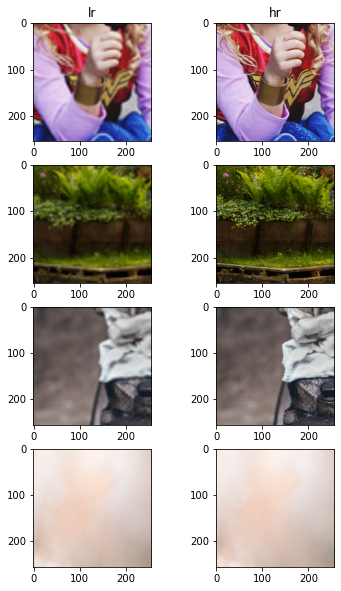

In [6]:
# Visualize Training Data
fig, ax = plt.subplots(nrows=4, ncols=2, figsize=(6,10))

for i in range(4):
    image = next(iter(train_ds))
    ax[i][0].imshow(image[0][i].numpy().astype('float32'))
    ax[i][1].imshow(image[1][i].numpy().astype('float32'))

ax[0][0].set_title("lr")
ax[0][1].set_title("hr")

print(image[0][i].numpy().shape, image[1][i].numpy().shape)

# 2. Train Model

In [10]:
def srcnn():
    """Return the srcnn model"""
    model = tf.keras.Sequential([
        layers.Input(shape=(None, None, 3)),
        layers.Conv2D(64, (9,9), padding="same"),
        layers.ReLU(),
        layers.Conv2D(32, (1,1), padding="same"),
        layers.ReLU(),
        layers.Conv2D(3, (5,5), padding="same")
    ])

    return model

def psnr(y_true, y_pred):
    max_pixel = 1.0
    return 10 * (tf.math.log(max_pixel ** 2) - tf.math.log(tf.reduce_mean(tf.math.square(y_true - y_pred)))) / tf.math.log(10.0)

In [11]:
model = srcnn()
model.summary()
model.compile(optimizer=tf.optimizers.Adam(learning_rate=1e-5),
              loss=tf.keras.losses.MeanSquaredError(),
              metrics=[psnr])
_ = tf.keras.utils.plot_model(model, to_file=os.path.join(model_dir, 'SRCNN.png'), show_shapes=True)

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_3 (Conv2D)           (None, None, None, 64)    15616     
                                                                 
 re_lu_2 (ReLU)              (None, None, None, 64)    0         
                                                                 
 conv2d_4 (Conv2D)           (None, None, None, 32)    2080      
                                                                 
 re_lu_3 (ReLU)              (None, None, None, 32)    0         
                                                                 
 conv2d_5 (Conv2D)           (None, None, None, 3)     2403      
                                                                 
Total params: 20,099
Trainable params: 20,099
Non-trainable params: 0
_________________________________________________________________


In [12]:
# Load the pre-trained model and continue training
model.load_weights(os.path.join(model_dir, 'srcnn_x4.h5'))

In [13]:
# earlyStopping = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=2)
history = model.fit(train_ds, validation_data=val_ds, epochs=10, verbose=1, batch_size=batch_size)

Epoch 1/10


2022-01-03 13:02:43.960576: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.


   1961/Unknown - 1436s 729ms/step - loss: 0.0029 - psnr: 27.1917

2022-01-03 13:26:40.299280: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.


1961/1961 [==============================] - 1528s 776ms/step - loss: 0.0029 - psnr: 27.1917 - val_loss: 0.0028 - val_psnr: 27.1858
Epoch 2/10
1961/1961 [==============================] - 1524s 775ms/step - loss: 0.0029 - psnr: 27.2045 - val_loss: 0.0028 - val_psnr: 27.1923
Epoch 3/10
1961/1961 [==============================] - 1524s 775ms/step - loss: 0.0029 - psnr: 27.2129 - val_loss: 0.0028 - val_psnr: 27.1968
Epoch 4/10
1961/1961 [==============================] - 1523s 775ms/step - loss: 0.0029 - psnr: 27.2207 - val_loss: 0.0028 - val_psnr: 27.2121
Epoch 5/10
1961/1961 [==============================] - 1523s 775ms/step - loss: 0.0029 - psnr: 27.2279 - val_loss: 0.0028 - val_psnr: 27.2207
Epoch 6/10
1961/1961 [==============================] - 1525s 776ms/step - loss: 0.0029 - psnr: 27.2350 - val_loss: 0.0028 - val_psnr: 27.1257
Epoch 7/10
1961/1961 [==============================] - 1524s 775ms/step - loss: 0.0029 - psnr: 27.2402 - val_loss: 0.0028 - val_psnr: 27.2322
Epoch 8/10

[]

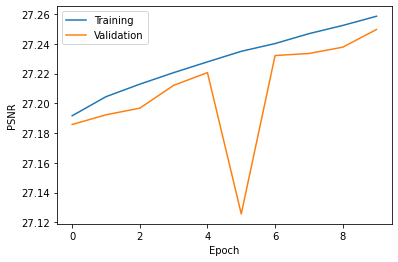

In [14]:
fig, ax = plt.subplots(figsize=(6,4))
ax.plot(history.history['psnr'], label='Training')
ax.plot(history.history['val_psnr'], label='Validation')
ax.set_xlabel("Epoch")
ax.set_ylabel("PSNR")
ax.legend()
ax.plot()

In [15]:
# Save model
model.save_weights(os.path.join(model_dir, 'srcnn_x4_v2.h5'))

# 3. Evaluation

In [16]:
model.load_weights(os.path.join(model_dir, 'srcnn_x4_v2.h5'))

Because we are going to evaluate on images with different sizes, we cannot predict them in batches and we cannot load them as dataset like the training and validation dataset above.  
We need to load the images to numpy arrays and upscale them using bicubic interpolation ourselves, and then predict them one by one.  

Since only HR images are provided, we need to downscale it ourselves.  
Also, an upscale function is implemented for upscaling LR images with bicubic interpolation.

### Validation Set

In [17]:
# Load the DIV2K validation dataset
val_hr_dir = 'data/DIV2K/validation/HR'
# val_lr_dir = 'data/DIV2K/validation/LRx4_unknown' # This is more difficult than bicubic downgrade
val_hr_images = utils.image_array_from_directory(val_hr_dir, downscale_factor=upscale_factor, limit=5)
val_lr_images = utils.image_array_from_directory(val_hr_dir, downscale_factor=upscale_factor, downscale=True, limit=5)

bicubic_val_lr_images = []
for image in val_lr_images:
    image = tf.keras.preprocessing.image.array_to_img(image * 255)
    image = utils.upscale_image(image, upscale_factor)
    image = tf.keras.preprocessing.image.img_to_array(image)
    bicubic_val_lr_images.append(image / 255)

5 images loaded from data/DIV2K/validation/HR.
5 images downscaled by a factor of 4 from data/DIV2K/validation/HR.


In [18]:
# Make predictions on validation set
predictions = []
for image in bicubic_val_lr_images:
    hr = model.predict(np.expand_dims(image, axis=0))[0]
    hr = tf.clip_by_value(hr, 0, 1)
    predictions.append(hr)
    if len(predictions) > 5:
        break

psnr_bicubic = []
psnr_srcnn = []
for i in range(len(predictions)):
    psnr_bicubic.append(tf.image.psnr(bicubic_val_lr_images[i], val_hr_images[i], 1.0).numpy())
    psnr_srcnn.append(tf.image.psnr(predictions[i], val_hr_images[i], 1.0).numpy())
psnr_bicubic = np.array(psnr_bicubic)
psnr_srcnn = np.array(psnr_srcnn)

print("PSNR (Bicubic):", np.average(psnr_bicubic))
print("PSNR (SRCNN):", np.average(psnr_srcnn))

2022-01-03 17:18:03.350666: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.
2022-01-03 17:18:04.434501: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.
2022-01-03 17:18:05.120289: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.


PSNR (Bicubic): 28.847467
PSNR (SRCNN): 29.610458


Text(0.5, 1.0, 'Ground Truth')

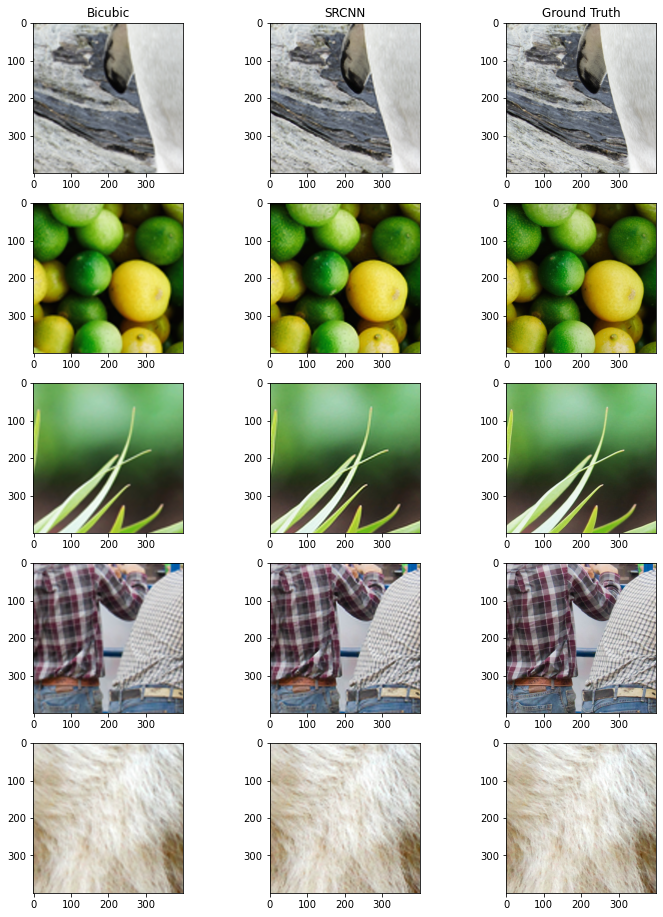

In [19]:
fig, ax = plt.subplots(nrows=5, ncols=3, figsize=(12, 16))

plot_size = 400
for i in range(5):
    x = np.random.randint(0, val_hr_images[i].shape[0]-plot_size)
    y = np.random.randint(0, val_hr_images[i].shape[1]-plot_size)
    ax[i][0].imshow(bicubic_val_lr_images[i][x:x+plot_size, y:y+plot_size,:])
    ax[i][1].imshow(predictions[i][x:x+plot_size, y:y+plot_size,:])
    ax[i][2].imshow(val_hr_images[i][x:x+plot_size, y:y+plot_size,:])

ax[0][0].set_title("Bicubic")
ax[0][1].set_title("SRCNN")
ax[0][2].set_title("Ground Truth")


### Set5

In [20]:
# Load the Set5 dataset
set5_hr_dir = 'data/Set5'
set5_hr_images = utils.image_array_from_directory(set5_hr_dir, downscale_factor=upscale_factor)
set5_lr_images = utils.image_array_from_directory(set5_hr_dir, downscale_factor=upscale_factor, downscale=True)

# Bicubic interpolation for comparison
bicubic_set5_lr_images = []
for image in set5_lr_images:
    image = tf.keras.preprocessing.image.array_to_img(image * 255)
    image = utils.upscale_image(image, upscale_factor)
    image = tf.keras.preprocessing.image.img_to_array(image)
    bicubic_set5_lr_images.append(image / 255)

5 images loaded from data/Set5.
5 images downscaled by a factor of 4 from data/Set5.


In [21]:
# Make predictions on Set5
predictions = []
for image in bicubic_set5_lr_images:
    hr = model.predict(np.expand_dims(image, axis=0))[0]
    hr = tf.clip_by_value(hr, 0, 1)
    predictions.append(hr)

psnr_bicubic = []
psnr_srcnn = []
for i in range(len(predictions)):
    psnr_bicubic.append(tf.image.psnr(bicubic_set5_lr_images[i], set5_hr_images[i], 1.0).numpy())
    psnr_srcnn.append(tf.image.psnr(predictions[i], set5_hr_images[i], 1.0).numpy())
psnr_bicubic = np.array(psnr_bicubic)
psnr_srcnn = np.array(psnr_srcnn)

print("PSNR (Bicubic):", np.average(psnr_bicubic), psnr_bicubic)
print("PSNR (SRCNN):", np.average(psnr_srcnn), psnr_srcnn)

2022-01-03 17:18:07.136826: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.


PSNR (Bicubic): 26.59675 [30.416115 28.068218 20.456728 28.963413 25.079266]
PSNR (SRCNN): 27.543762 [31.361061 29.232471 21.553692 29.288345 26.283247]


Text(0.5, 1.0, 'Ground Truth')

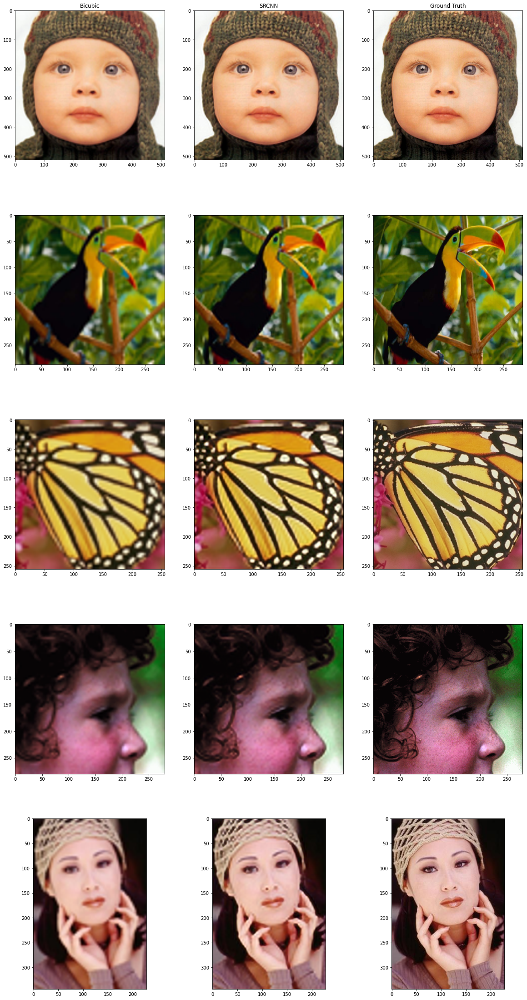

In [22]:
fig, ax = plt.subplots(nrows=5, ncols=3, figsize=(20, 40))

for i in range(5):
    ax[i][0].imshow(bicubic_set5_lr_images[i])
    ax[i][1].imshow(predictions[i])
    ax[i][2].imshow(set5_hr_images[i])

ax[0][0].set_title("Bicubic")
ax[0][1].set_title("SRCNN")
ax[0][2].set_title("Ground Truth")

### Set14

In [23]:
# Load the Set14 dataset
set14_hr_dir = 'data/Set14'
set14_hr_images = utils.image_array_from_directory(set14_hr_dir, downscale_factor=upscale_factor)
set14_lr_images = utils.image_array_from_directory(set14_hr_dir, downscale_factor=upscale_factor, downscale=True)

# Bicubic interpolation for comparison
bicubic_set14_lr_images = []
for image in set14_lr_images:
    image = tf.keras.preprocessing.image.array_to_img(image * 255)
    image = utils.upscale_image(image, upscale_factor)
    image = tf.keras.preprocessing.image.img_to_array(image)
    bicubic_set14_lr_images.append(image / 255)

14 images loaded from data/Set14.
14 images downscaled by a factor of 4 from data/Set14.


In [24]:
# Make predictions on Set14
predictions = []
for image in bicubic_set14_lr_images:
    hr = model.predict(np.expand_dims(image, axis=0))[0]
    hr = tf.clip_by_value(hr, 0, 1)
    predictions.append(hr)

psnr_bicubic = []
psnr_srcnn = []
for i in range(len(predictions)):
    psnr_bicubic.append(tf.image.psnr(bicubic_set14_lr_images[i], set14_hr_images[i], 1.0).numpy())
    psnr_srcnn.append(tf.image.psnr(predictions[i], set14_hr_images[i], 1.0).numpy())
psnr_bicubic = np.array(psnr_bicubic)
psnr_srcnn = np.array(psnr_srcnn)

print("PSNR (Bicubic):", np.average(psnr_bicubic), psnr_bicubic)
print("PSNR (SRCNN):", np.average(psnr_srcnn), psnr_srcnn)

PSNR (Bicubic): 23.864874 [20.251326 23.492079 23.058163 23.99146  20.705992 28.893435 24.017973
 24.908741 27.736486 22.748953 25.3633   24.942438 20.758593 23.239292]
PSNR (SRCNN): 24.517517 [20.44439  23.894701 23.52432  24.424833 21.389172 29.184069 24.881254
 25.644033 28.321383 22.981205 26.355444 25.119854 22.135426 24.945148]


Text(0.5, 1.0, 'Ground Truth')

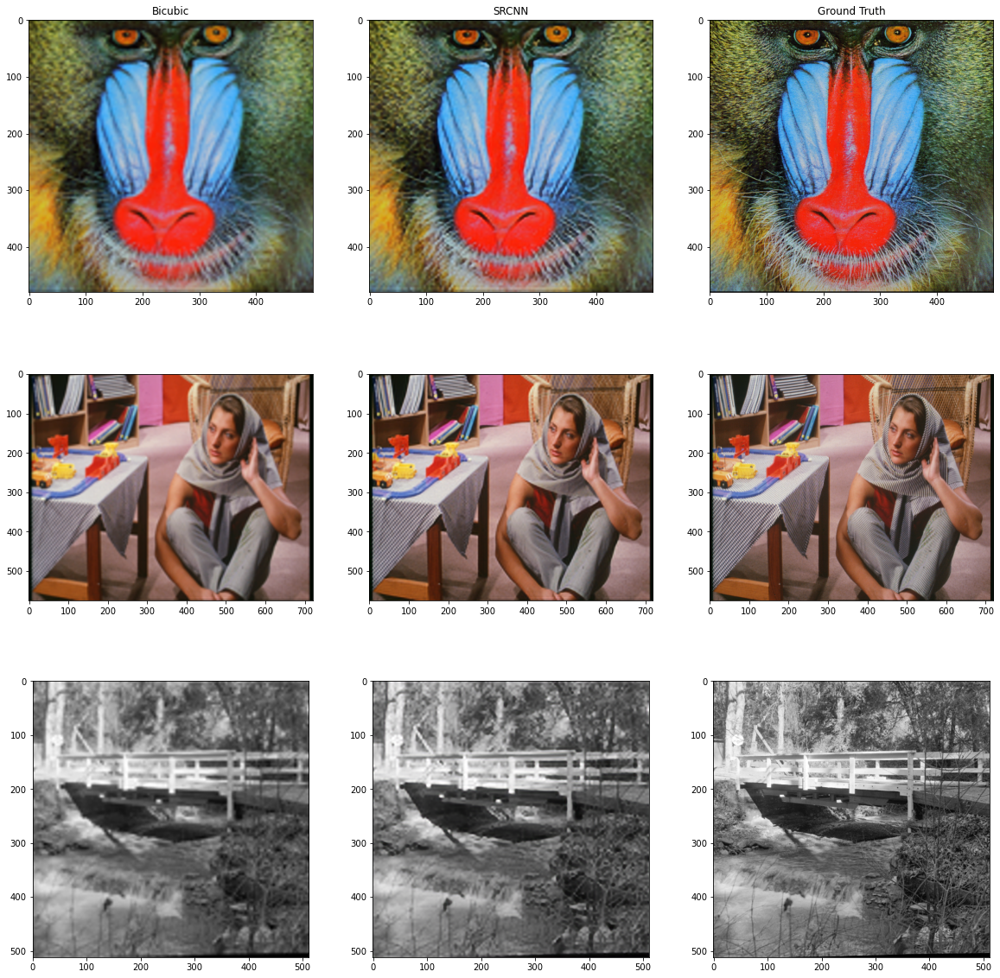

In [25]:
fig, ax = plt.subplots(nrows=3, ncols=3, figsize=(20, 20))

for i in range(3):
    ax[i][0].imshow(bicubic_set14_lr_images[i])
    ax[i][1].imshow(predictions[i])
    ax[i][2].imshow(set14_hr_images[i])

ax[0][0].set_title("Bicubic")
ax[0][1].set_title("SRCNN")
ax[0][2].set_title("Ground Truth")

## Visualizing Model Outputs 

In [26]:
from keras import backend as K

In [27]:
input_image = bicubic_set5_lr_images[2]

outputs = []
for layer in model.layers:
    keras_function = K.function([model.input], [layer.output])
    outputs.append(keras_function([np.expand_dims(input_image, axis=0)]))

Input image: (256, 256, 3)


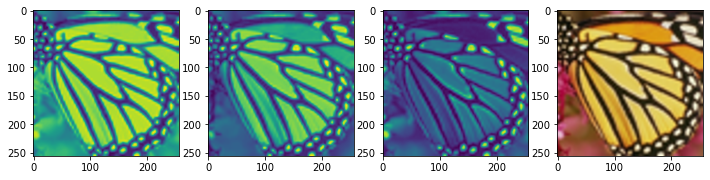

In [28]:
print("Input image:", input_image.shape)

fig, ax = plt.subplots(nrows=1, ncols=4, figsize=(12,6))
for i in range(3):
    ax[i].imshow(input_image[:,:,i])
ax[3].imshow(input_image)

First Layer Output: (256, 256, 64)


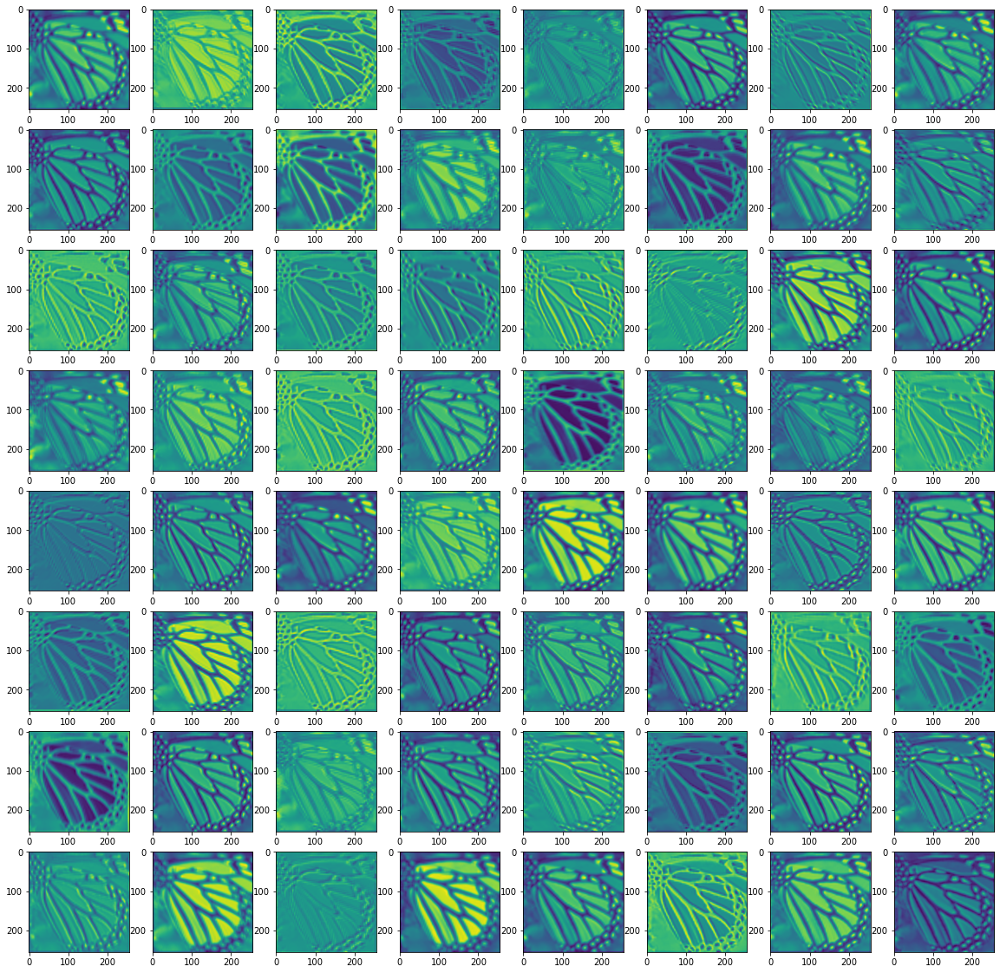

In [29]:
print("First Layer Output:", np.array(outputs[0][0][0]).shape)

fig, ax = plt.subplots(nrows=8, ncols=8, figsize=(20,20))
layer0_outputs = np.array(outputs[0][0][0])
for i in range(layer0_outputs.shape[-1]):
    ax[i//8][i%8].imshow(layer0_outputs[:,:,i])

First Layer Output (After activation): (256, 256, 64)


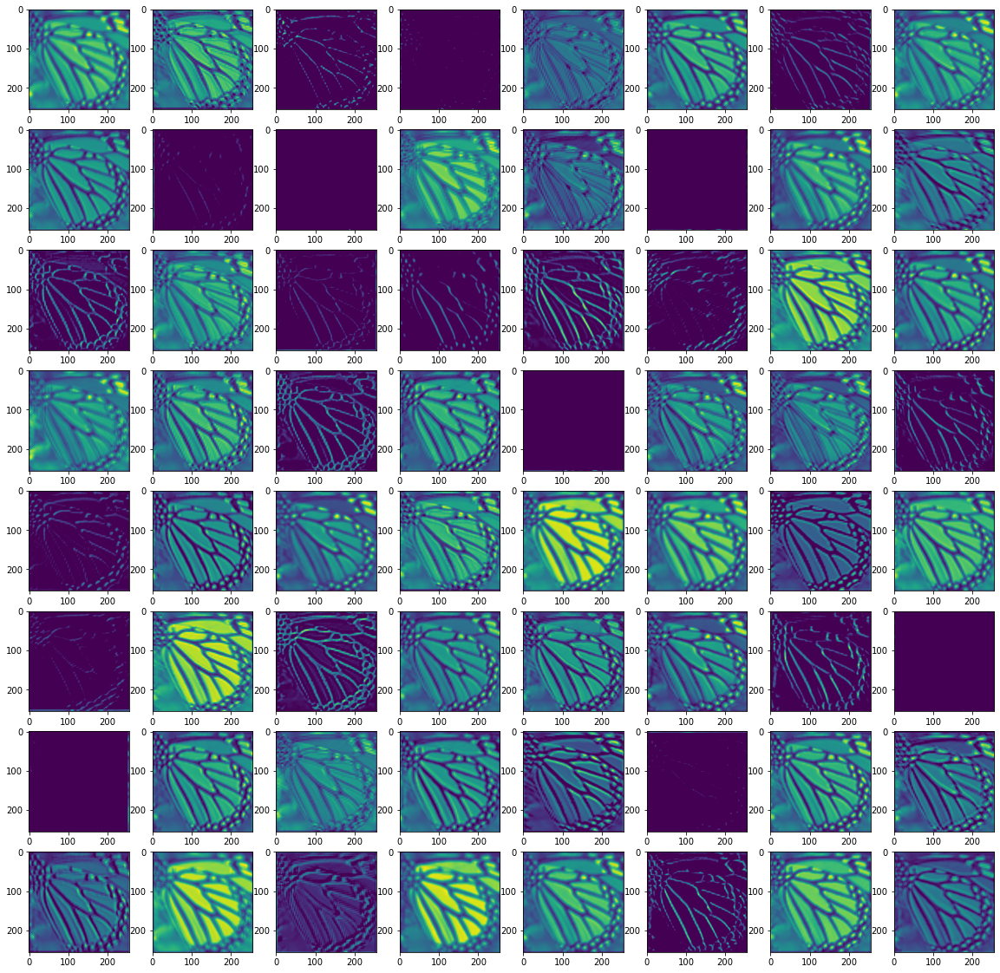

In [30]:
print("First Layer Output (After activation):", np.array(outputs[1][0][0]).shape)

fig, ax = plt.subplots(nrows=8, ncols=8, figsize=(20,20))
layer1_outputs = np.array(outputs[1][0][0])
for i in range(layer1_outputs.shape[-1]):
    ax[i//8][i%8].imshow(layer1_outputs[:,:,i])

Second Layer Output: (256, 256, 32)


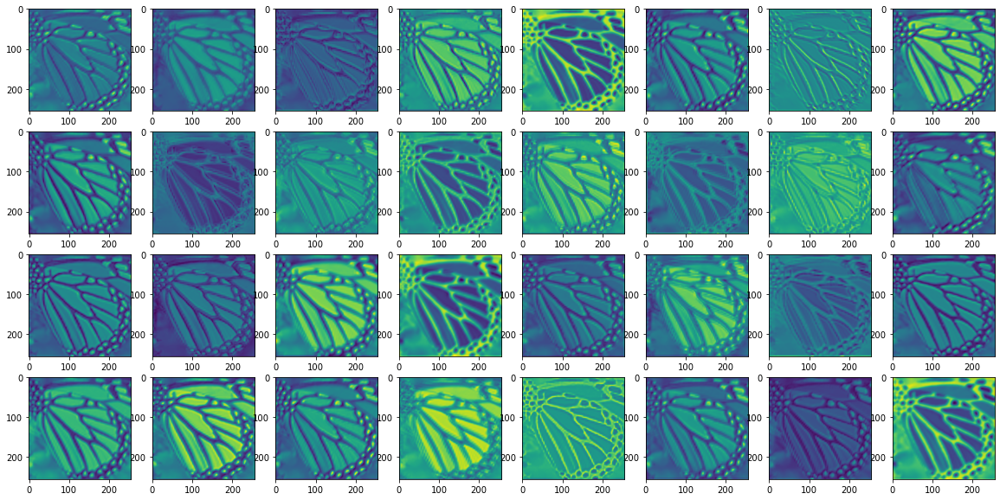

In [31]:
print("Second Layer Output:", np.array(outputs[2][0][0]).shape)

fig, ax = plt.subplots(nrows=4, ncols=8, figsize=(20,10))
layer2_outputs = np.array(outputs[2][0][0])
for i in range(layer2_outputs.shape[-1]):
    ax[i//8][i%8].imshow(layer2_outputs[:,:,i])

Second Layer Output (After activation): (256, 256, 32)


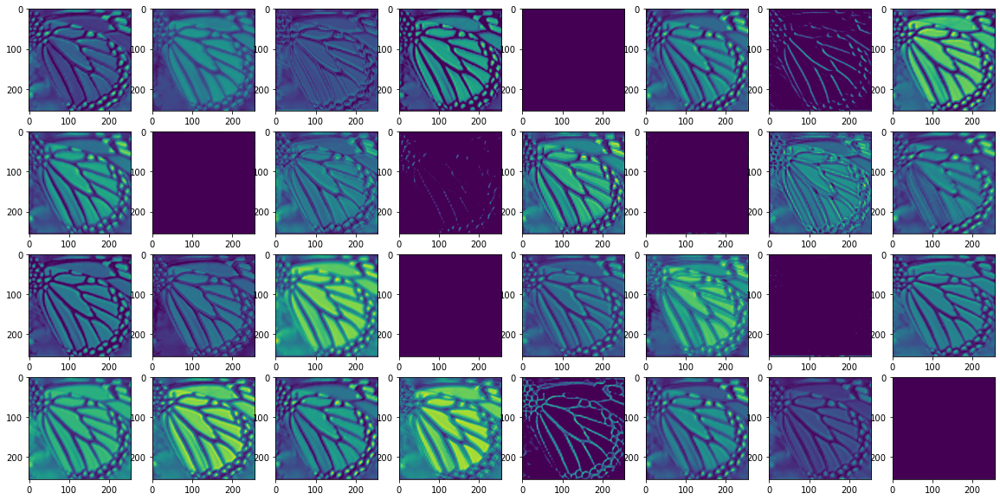

In [32]:
print("Second Layer Output (After activation):", np.array(outputs[3][0][0]).shape)

fig, ax = plt.subplots(nrows=4, ncols=8, figsize=(20,10))
layer3_outputs = np.array(outputs[3][0][0])
for i in range(layer3_outputs.shape[-1]):
    ax[i//8][i%8].imshow(layer3_outputs[:,:,i])

Output Layer Output: (256, 256, 3)


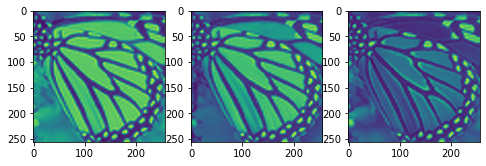

In [33]:
print("Output Layer Output:", np.array(outputs[4][0][0]).shape)

fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(8,4))
layer4_outputs = np.array(outputs[4][0][0])
for i in range(layer4_outputs.shape[-1]):
    ax[i%3].imshow(layer4_outputs[:,:,i])